In [3]:
import transformers
import datasets
import shap
from shap.plots import *
import csv
import nltk
import re, string
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from collections import Counter
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import datetime
import torch
import random
from PIL import Image
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tomek\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
# convert date from string to datetime object
def convert_date(tweets):
    for i in range(len(tweets)):
        tweets['date'][i] = datetime.datetime.strptime(tweets['date'][i], '%Y-%m-%d %H:%M:%S')
    return tweets
        
# select n random tweets from start date to end date
def choose_tweets_from_date(tweets, start, end, n):
    start = datetime.datetime.strptime(start, '%Y-%m-%d')
    end = datetime.datetime.strptime(end, '%Y-%m-%d')
    choices = []
    for i in range(len(tweets)):
        if start <= tweets['date'][i] <= end:
            el = tweets['content'][i]
            choices.append(el)
        
    chosen=random.sample(choices, n)

    return chosen

def clean_text(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\'','', text)
    
    return text

def load_and_preprocess_tweets():
    tweets = pd.read_csv('WFiIS-UM-main/datasets/realdonaldtrump.csv')
    tweets = tweets.drop(['link', 'retweets', 'favorites', 'mentions', 'hashtags'], axis=1)

    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'@\w+\s', ' ', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'https?://\S+|www\.\S+', '', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'\W+', ' ', x))
    tweets['content'] = tweets['content'].replace(r'\W+', ' ', regex=True)
    tweets['content'] = tweets['content'].apply(lambda x: clean_text(x))
    tweets['token'] = tweets['content'].apply(lambda x: word_tokenize(x))
    tweets['text'] = tweets['token'].apply(lambda x: ' '.join([word for word in x if len(word)>2]))
    convert_date(tweets)

    return tweets

In [5]:
tweets = load_and_preprocess_tweets()

In [6]:
n = 20
before = choose_tweets_from_date(tweets, '2011-01-01', '2017-01-19', n)
after = choose_tweets_from_date(tweets, '2017-01-20', '2021-01-20', n)
before

[' katemattox realdonaldtrump every club you own is spectacular my friend got married a lago spectacular thank you ',
 ' yeah blame me moron ',
 'congrats to yankees on finishing  in the al east derek jeter is great good luck in the playoffs ',
 ' most anticipated hotel openings of  trump international hotel washington d c ',
 ' ericschiffer a talented family led by the best donaldjtrumpjr erictrump ivankatrump thanks eric so nice ',
 ' teapartynevada  illegals are taken care of better than our veterans pic twitter com  ',
 'my gretawire interview discussing my  charitable offer to obama his lack of transparency my tremendous support ',
 ' trust in god and be true to yourself mary macleod trump know everything you can about what you re doing fred c trump',
 '  have already lost their health care plans thanks to obamacare defund now and repeal later ',
 'how stressed are lisarinna and pennjillette already celebapprentice',
 'new hampshire is a critical state for both candidates this yea

In [7]:
top = Counter([item for sublist in tweets['token'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,the,34657
1,to,19801
2,and,15928
3,a,15491
4,of,13345
5,is,12886
6,in,11942
7,i,10795
8,you,10716
9,for,9991


In [8]:
fig = px.bar(temp, x="count", y="Common_words", title='Common Words in Selected Text', orientation='h', 
          width=700, height=700,color='Common_words')
fig.show()

In [9]:
classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(before)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True) 

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(before)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:17<00:22,  1.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:24<00:54,  3.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:30<01:03,  4.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:40<01:18,  6.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:48<01:17,  7.06s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:55<01:10,  7.06s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [01:02<01:03,  7.09s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [01:08<00:54,  6.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [01:15<00:47,  6.78s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [01:23<00:24,  5.00s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [01:30<00:22,  5.71s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [01:39<00:09,  4.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [01:54<00:00,  6.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 21it [02:01,  6.76s/it]                                                                                                                                                    


In [10]:
shap.plots.text(shap_values[:,:,1])

C:\Users\tomek\miniconda3\envs\um\lib\site-packages\slicer\slicer_internal.py:443: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



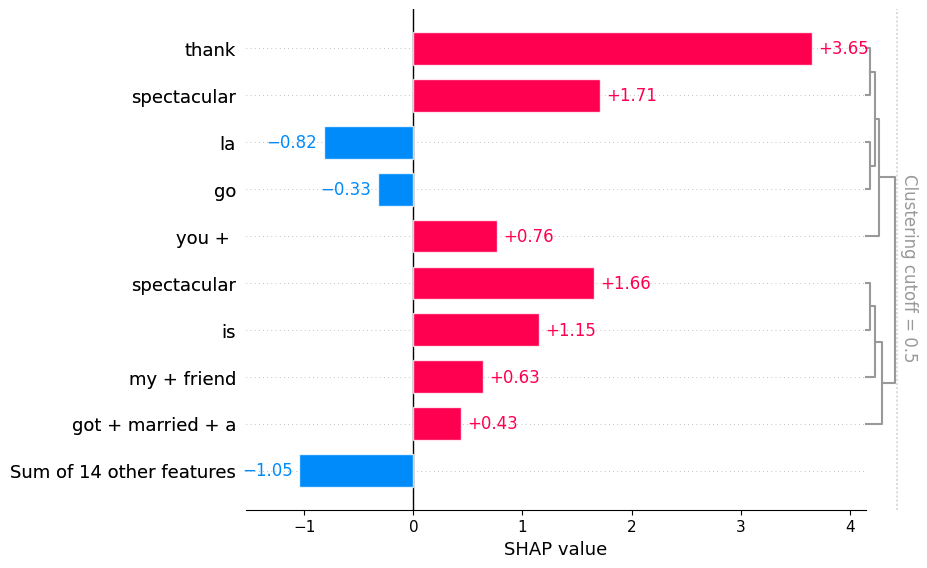

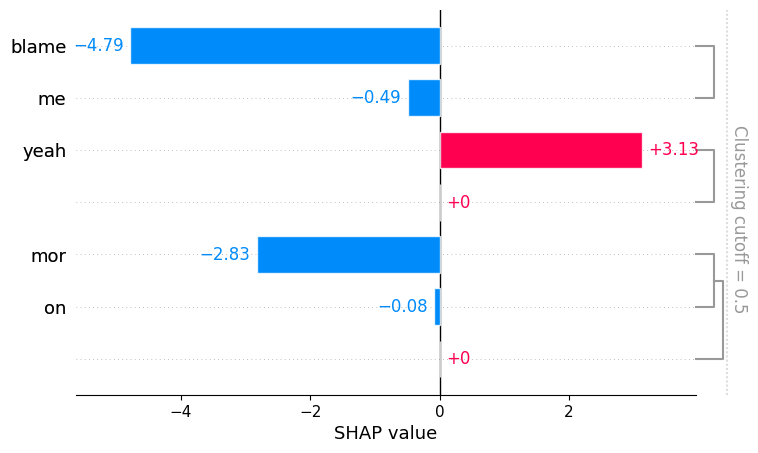

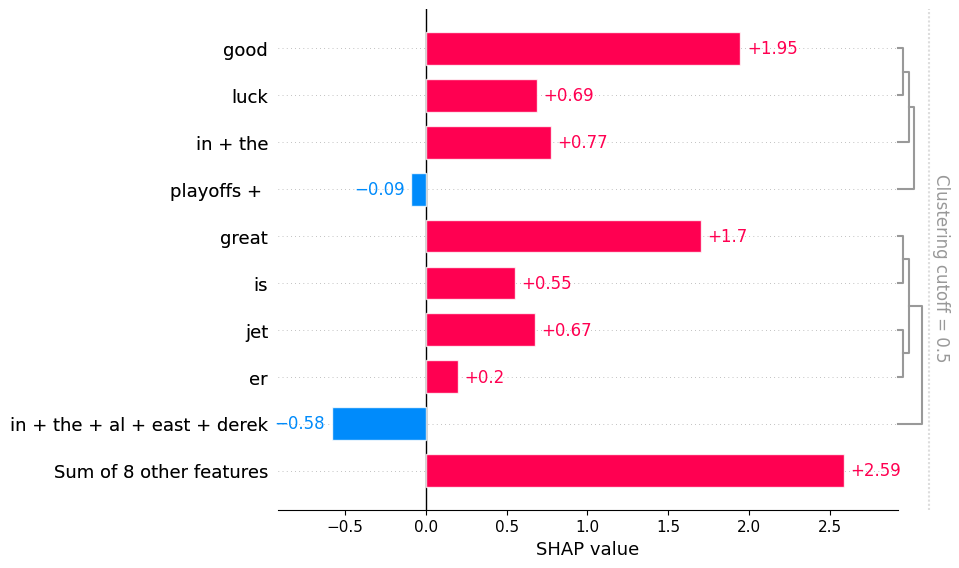

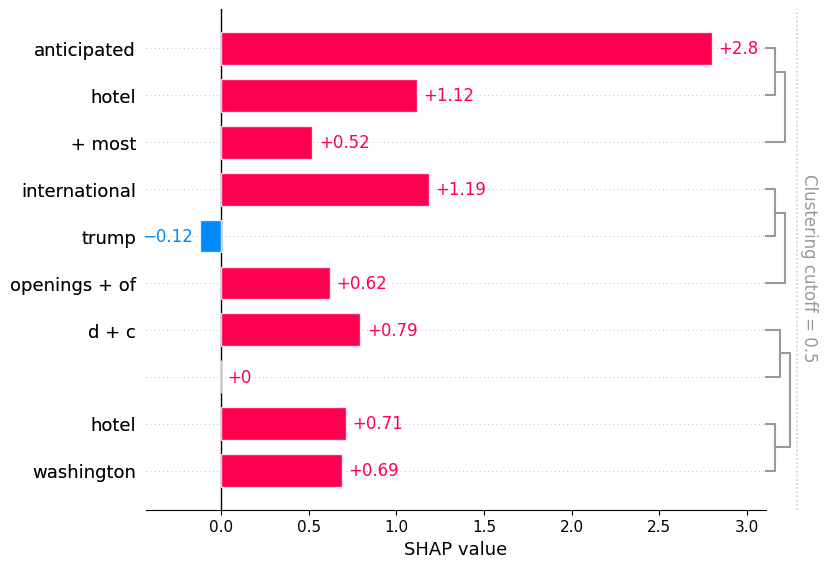

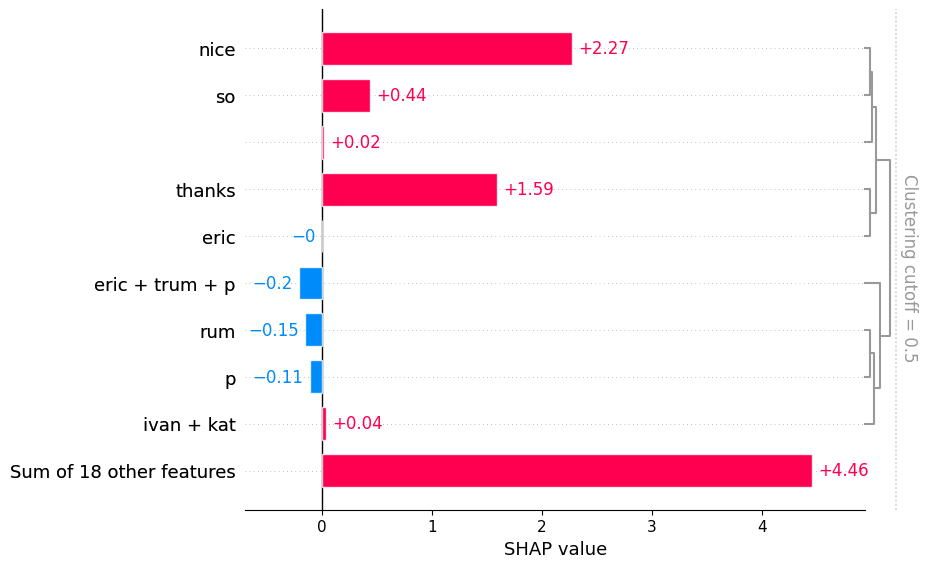

...

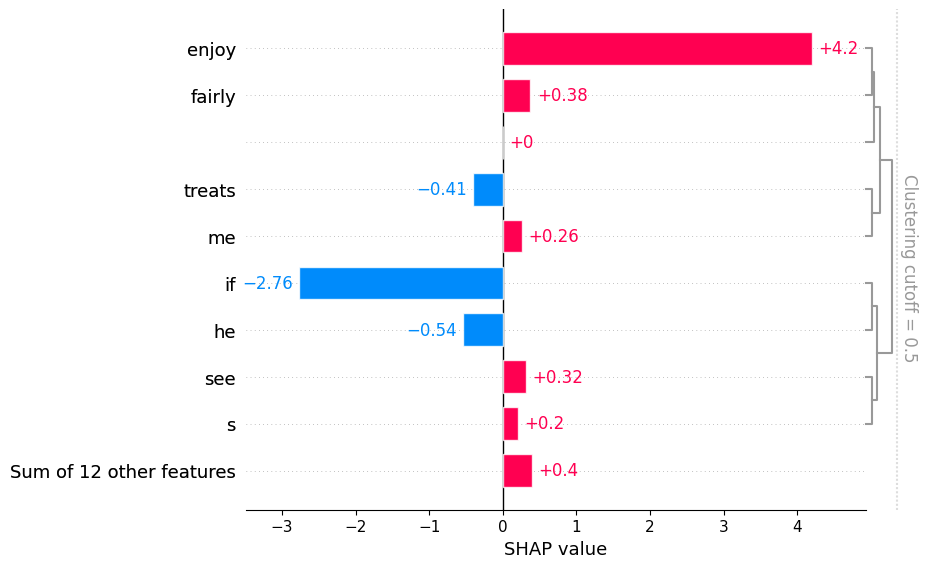

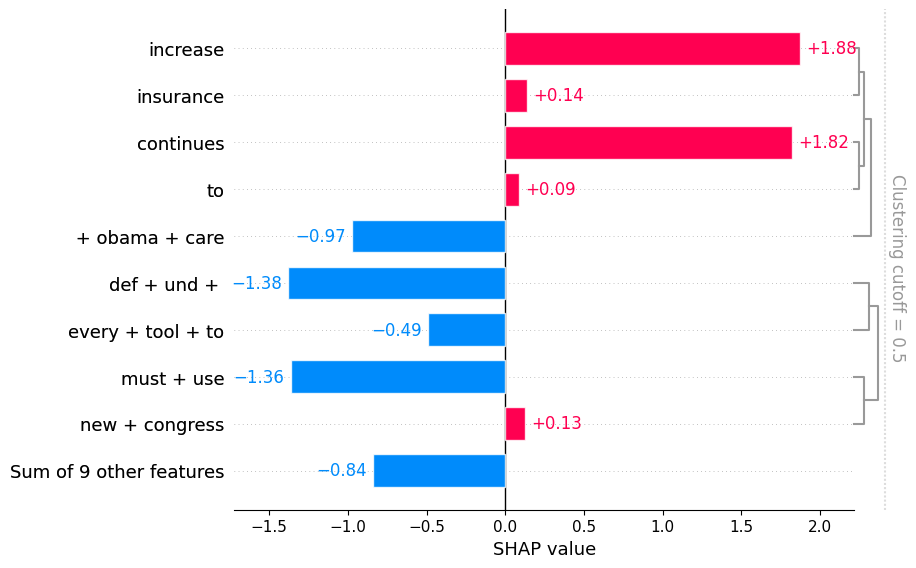

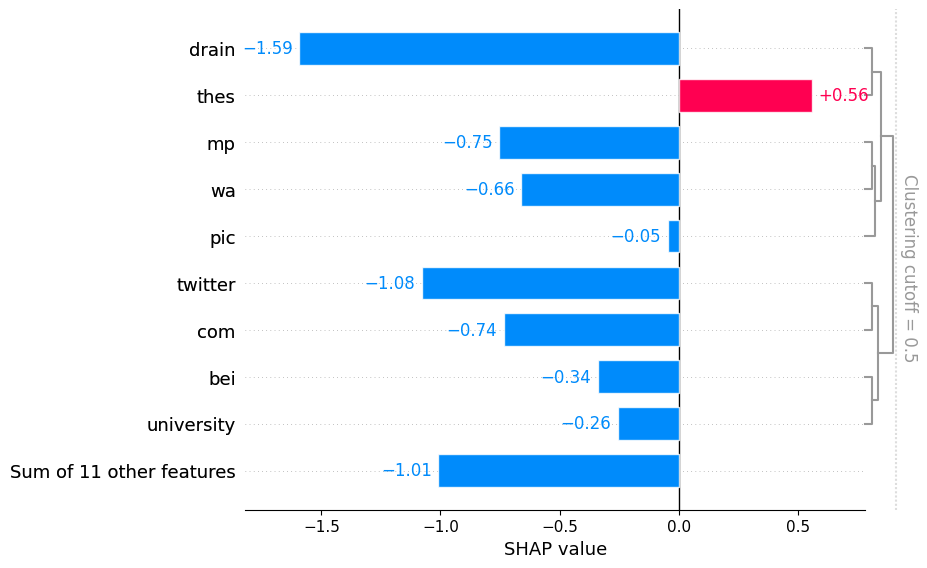

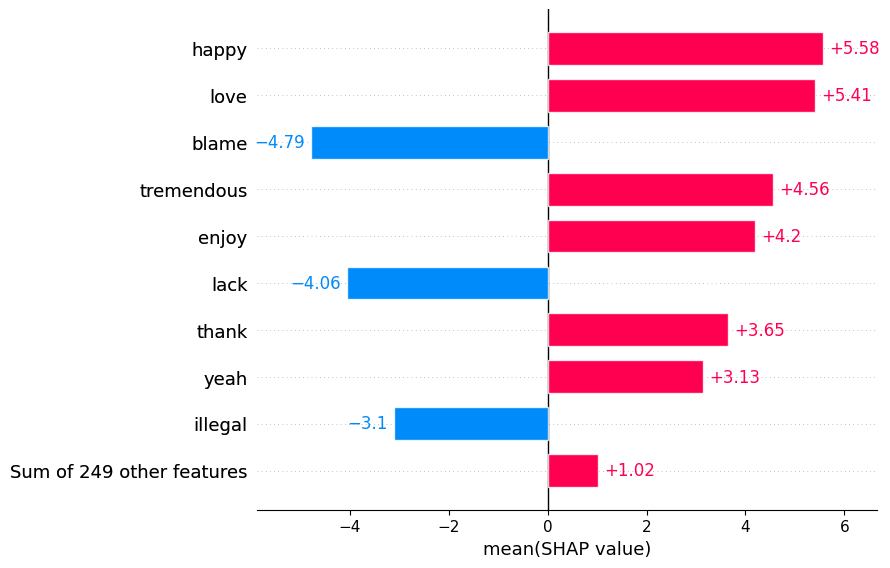

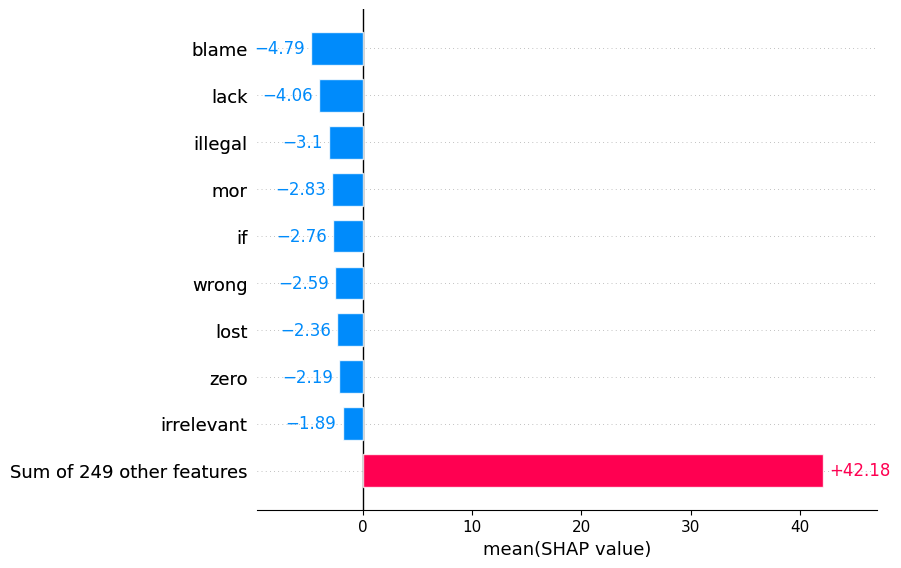

In [11]:
for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [12]:
average_before = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)
print(average_before)

0.060514768485673776


In [13]:
classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(after)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True)

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(after)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  10%|██████████████▎                                                                                                                                | 2/20 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:28<00:56,  3.77s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:39<01:30,  6.44s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:54<00:55,  5.03s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [01:00<00:53,  5.32s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [01:09<00:57,  6.43s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [01:16<00:53,  6.71s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [01:28<00:35,  5.94s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [01:58<00:25,  8.47s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [02:07<00:17,  8.55s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [02:18<00:09,  9.38s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 21it [02:27,  7.79s/it]                                                                                                                                                    


In [14]:
shap.plots.text(shap_values[:,:,1])

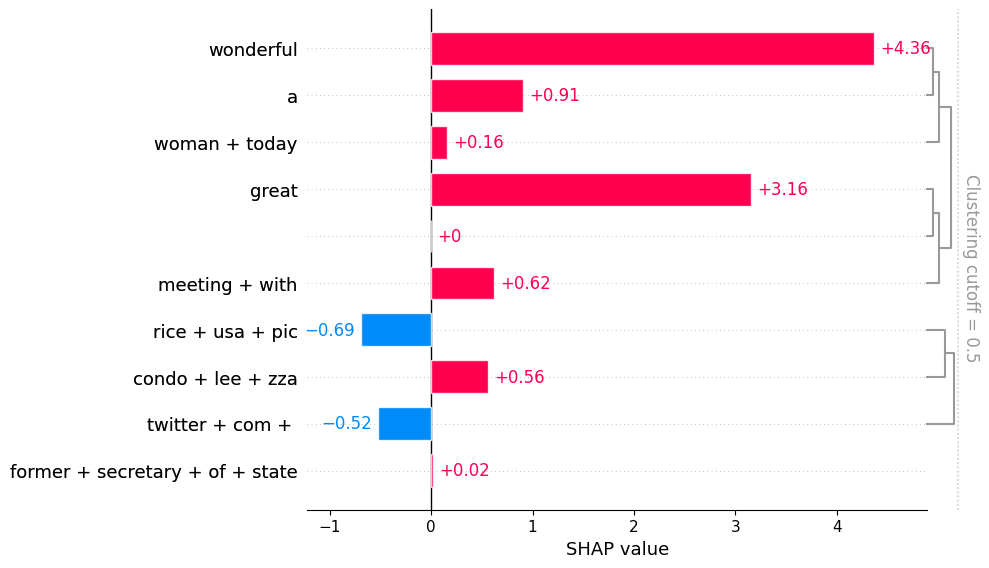

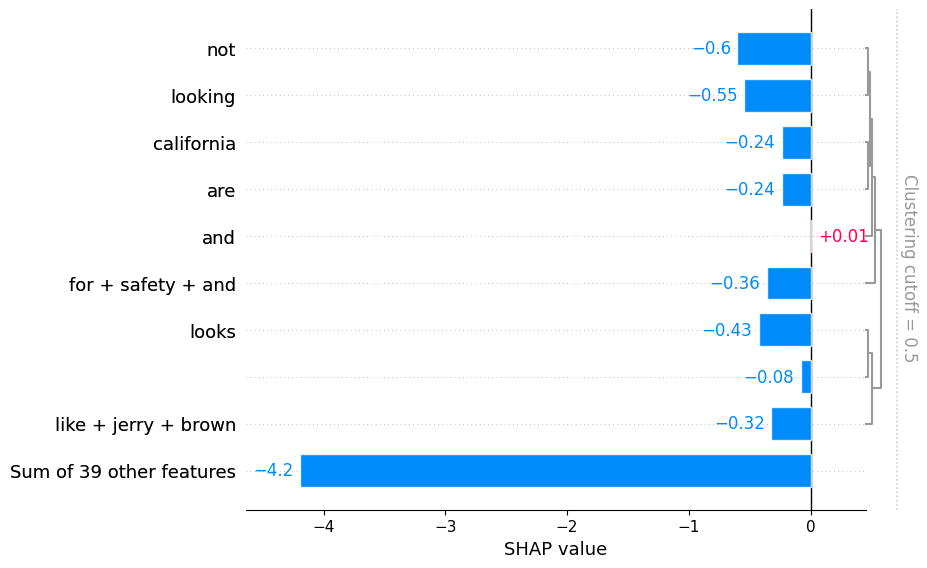

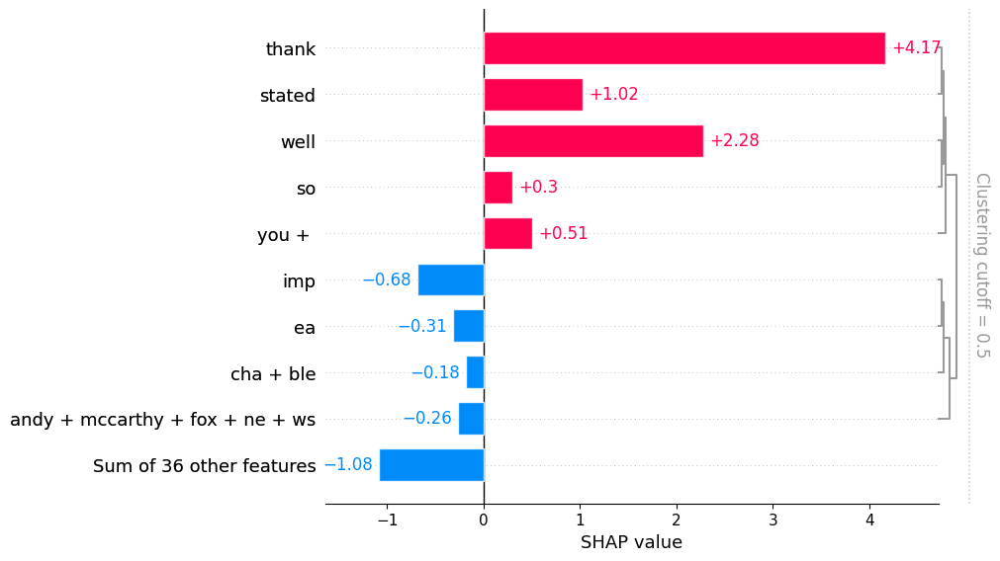

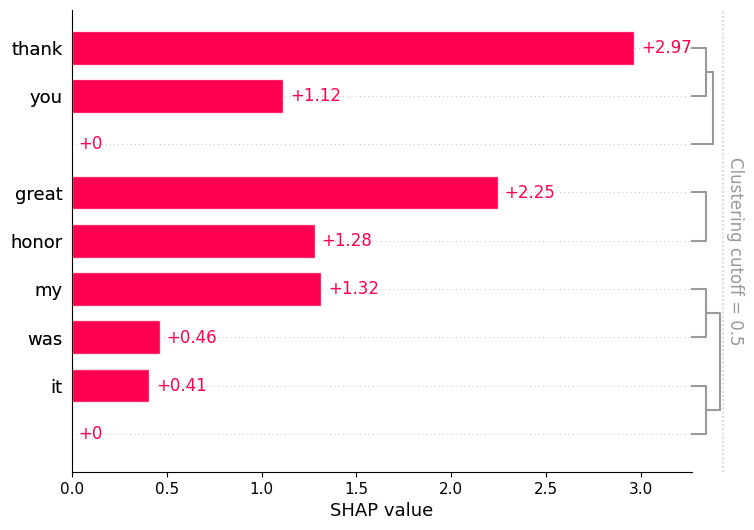

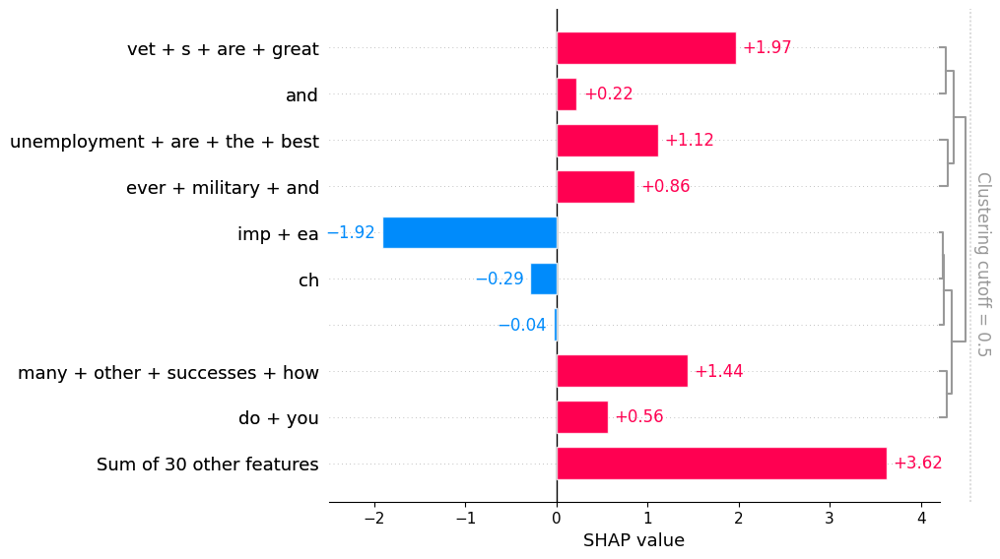

...

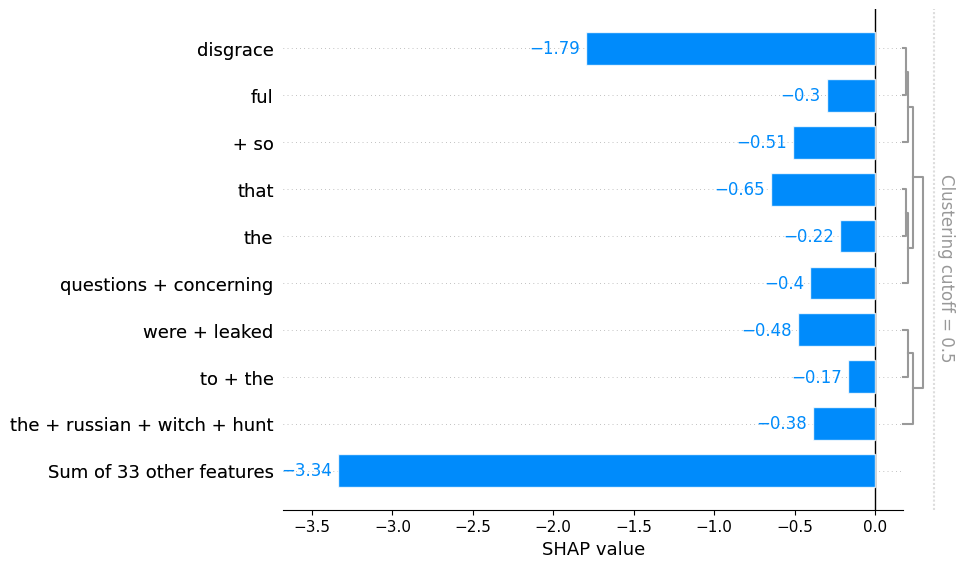

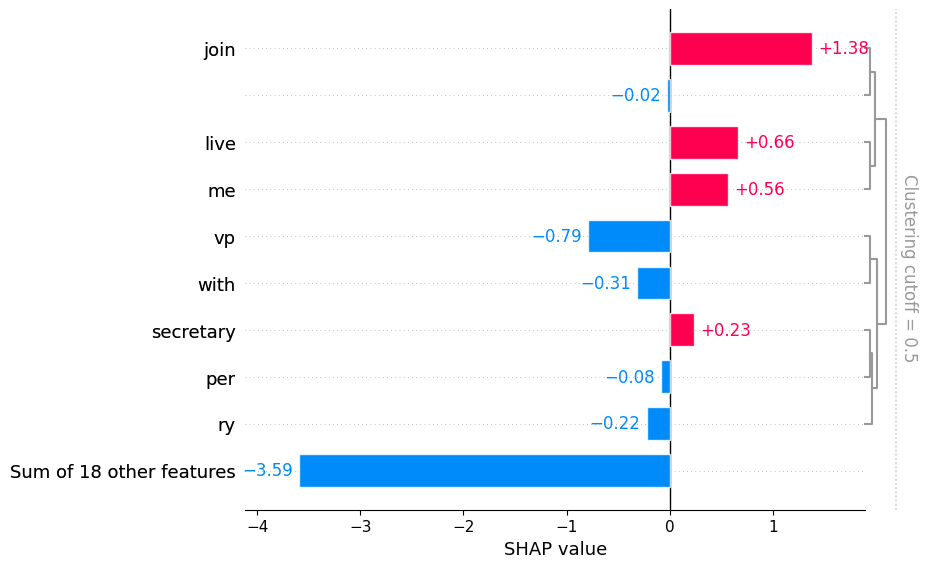

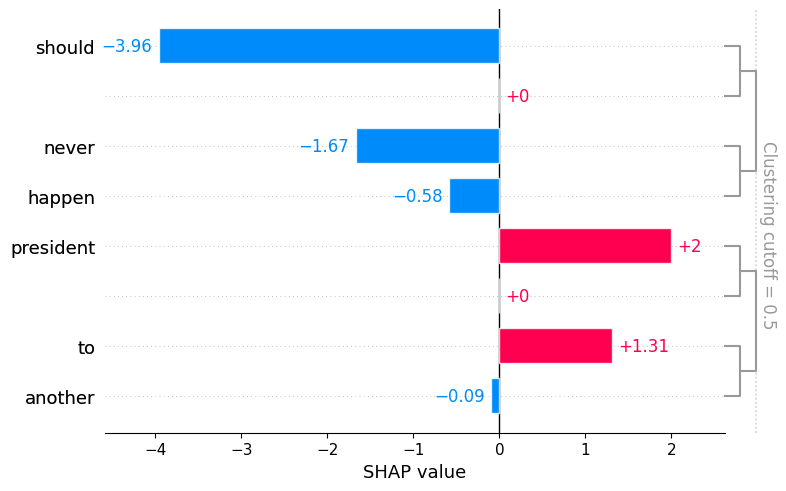

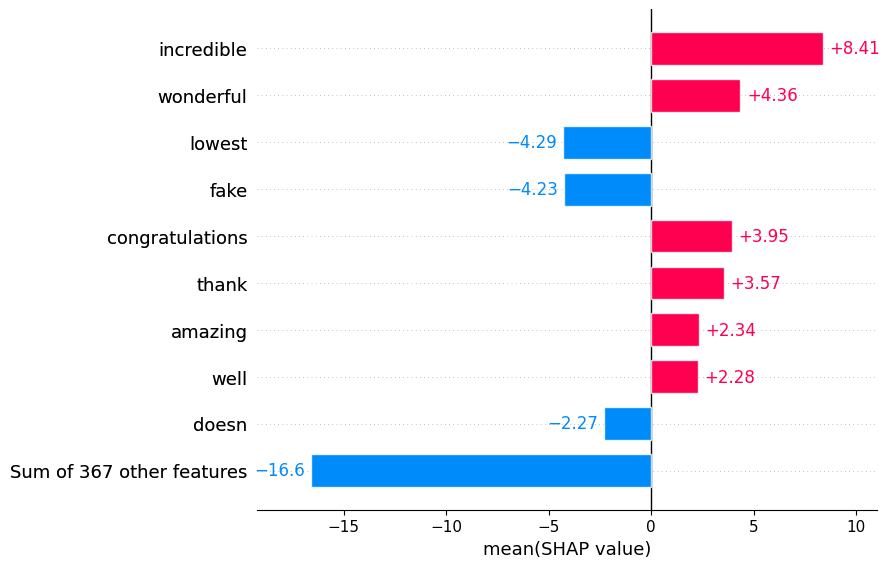

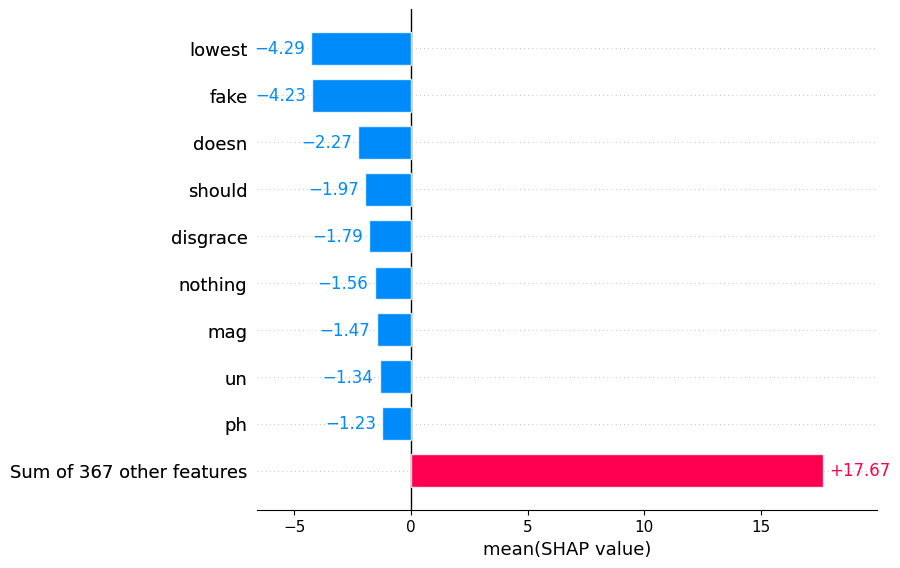

In [15]:
for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [16]:
average_after = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)

print(average_before)
print(average_after)

0.060514768485673776
-0.0066169585905577295


In [17]:
negative, positive = np.zeros((tweets.shape[0], 1)), np.zeros((tweets.shape[0], 1))

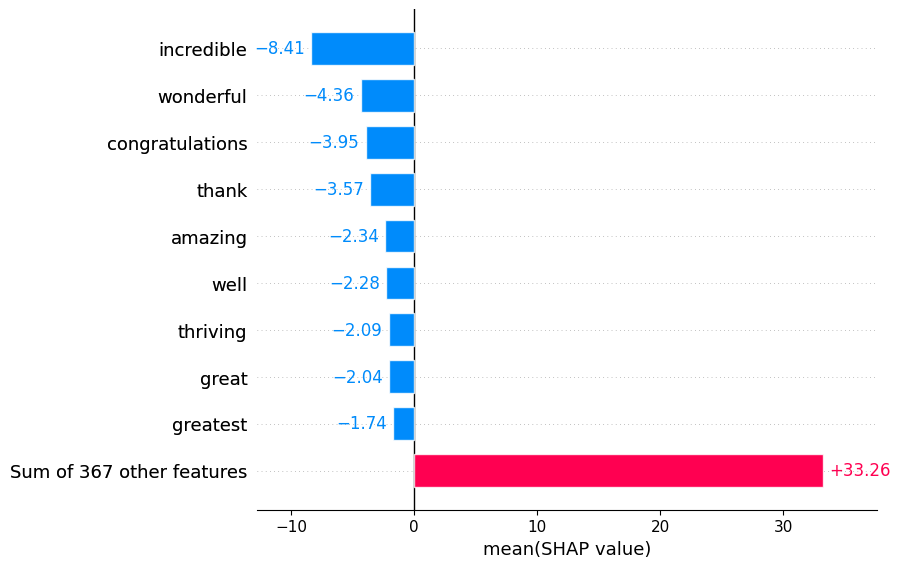

In [18]:
shap.plots.bar(shap_values[:, :, "NEGATIVE"].mean(0), order=shap.Explanation.argsort)